In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import pickle
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, RocCurveDisplay
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.cluster import KMeans

import xgboost as xgb
from transformers import T5Tokenizer, T5Model
import torch
from transformers import T5Tokenizer, T5EncoderModel
import torch
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer, BertModel
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import lime

In [2]:
import torch
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from transformers import BertTokenizer, BertModel
from tqdm import tqdm

def preprocess_data_with_bert(file_path, batch_size=32, max_length=512):
    # Load the data
    df = pd.read_excel(file_path)
    
    # Ensure that 'Text' column is used as the independent variable
    df['Text'] = df['Text'].astype(str)
    
    # Drop any rows where 'Text' or 'Type' is NaN
    df.dropna(subset=['Text', 'Type'], inplace=True)
    
    # Define features and labels
    X = df['Text'].tolist()  # Convert the text to a list
    y = df['Type']
    
    # Encode the labels into numeric values
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    
    # Load pre-trained BERT tokenizer and model
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    model = BertModel.from_pretrained('bert-base-uncased').to('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Generate BERT embeddings for the texts in batches
    def get_bert_embeddings(texts):
        all_embeddings = []
        for i in tqdm(range(0, len(texts), batch_size)):
            batch_texts = texts[i:i + batch_size]
            inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors='pt', max_length=max_length).to(model.device)
            with torch.no_grad():  # Disable gradient calculations for inference
                outputs = model(**inputs)
                batch_embeddings = outputs.last_hidden_state.mean(dim=1)  # Mean of all token embeddings
                all_embeddings.append(batch_embeddings.cpu())
        return torch.cat(all_embeddings, dim=0)
    
    # Generate embeddings for all the text data
    X_embeddings = get_bert_embeddings(X)
    
    # Convert PyTorch tensors to NumPy arrays
    X_embeddings = X_embeddings.numpy()
    
    # Split the data into training and test sets (70% training, 30% testing)
    X_train, X_test, y_train, y_test = train_test_split(X_embeddings, y_encoded, test_size=0.3, random_state=42)
    
    return X_train, X_test, y_train, y_test, label_encoder

# Run the function
file_path = 'test.xlsx'
X_train, X_test, y_train, y_test, label_encoder = preprocess_data_with_bert(file_path)


100%|█████████████████████████████████████████| 109/109 [00:31<00:00,  3.46it/s]


100%|█████████████████████████████████████████| 109/109 [00:32<00:00,  3.39it/s]


Results for SVM - Training Set:
Training Accuracy: 0.8421
Classification Report (Training):
              precision    recall  f1-score   support

      Answer       0.80      0.67      0.73       670
    Question       0.94      0.93      0.93       549
   Statement       0.82      0.90      0.86      1220

    accuracy                           0.84      2439
   macro avg       0.85      0.83      0.84      2439
weighted avg       0.84      0.84      0.84      2439


Results for SVM - Test Set:
Test Accuracy: 0.7409
Classification Report (Test):
              precision    recall  f1-score   support

      Answer       0.65      0.54      0.59       323
    Question       0.92      0.86      0.89       219
   Statement       0.72      0.82      0.77       504

    accuracy                           0.74      1046
   macro avg       0.76      0.74      0.75      1046
weighted avg       0.74      0.74      0.74      1046



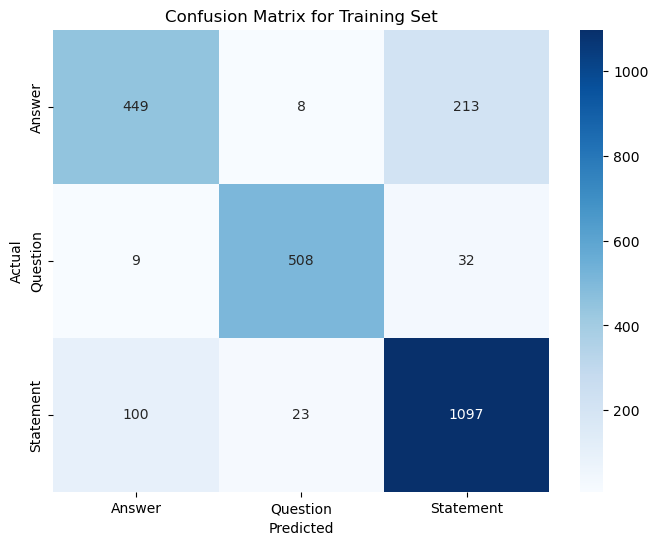

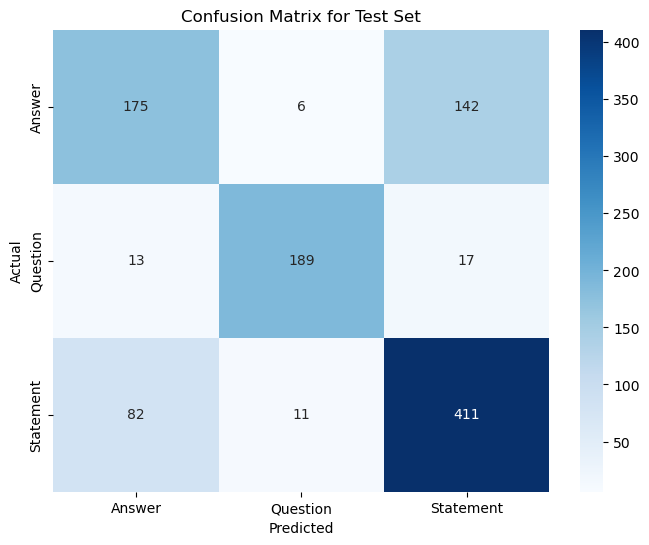

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import pickle
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, RocCurveDisplay, accuracy_score
from sklearn.svm import SVC
from transformers import BertTokenizer, BertModel
import torch
from tqdm import tqdm
from lime.lime_text import LimeTextExplainer

# Function to preprocess data and generate BERT embeddings
def preprocess_data_with_bert(file_path, batch_size=32, max_length=512):
    # Load the data
    df = pd.read_excel(file_path)
    
    # Ensure that 'Text' column is used as the independent variable
    df['Text'] = df['Text'].astype(str)
    
    # Drop any rows where 'Text' or 'Type' is NaN
    df.dropna(subset=['Text', 'Type'], inplace=True)
    
    # Define features and labels
    X = df['Text'].tolist()  # Convert the text to a list
    y = df['Type']
    
    # Encode the labels into numeric values
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    
    # Load pre-trained BERT tokenizer and model
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    model = BertModel.from_pretrained('bert-base-uncased').to('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Generate BERT embeddings for the texts in batches
    def get_bert_embeddings(texts):
        all_embeddings = []
        for i in tqdm(range(0, len(texts), batch_size)):
            batch_texts = texts[i:i + batch_size]
            inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors='pt', max_length=max_length).to(model.device)
            with torch.no_grad():
                outputs = model(**inputs)
                batch_embeddings = outputs.last_hidden_state.mean(dim=1)
                all_embeddings.append(batch_embeddings.cpu())
        return torch.cat(all_embeddings, dim=0)
    
    X_embeddings = get_bert_embeddings(X).numpy()
    X_train, X_test, y_train, y_test = train_test_split(X_embeddings, y_encoded, test_size=0.3, random_state=42)
    
    return X_train, X_test, y_train, y_test, label_encoder

# Run the function
file_path = 'test.xlsx'
X_train, X_test, y_train, y_test, label_encoder = preprocess_data_with_bert(file_path)

# Function to plot confusion matrix
def plot_confusion_matrix(y_test, y_pred, label_encoder, title):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.title(f'Confusion Matrix for {title}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

# Function to train and evaluate SVM
def run_svm(X_train, X_test, y_train, y_test, label_encoder):
    model = SVC(probability=True)  # Enable probability predictions for LIME
    
    model.fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_pred_test)
    
    y_pred_train = model.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_pred_train)
    
    classification_rep_train = classification_report(y_train, y_pred_train, target_names=label_encoder.classes_)
    classification_rep_test = classification_report(y_test, y_pred_test, target_names=label_encoder.classes_)
    
    print("Results for SVM - Training Set:")
    print(f"Training Accuracy: {train_accuracy:.4f}")
    print("Classification Report (Training):")
    print(classification_rep_train)
    
    print("\nResults for SVM - Test Set:")
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print("Classification Report (Test):")
    print(classification_rep_test)
    
    plot_confusion_matrix(y_train, y_pred_train, label_encoder, "Training Set")
    plot_confusion_matrix(y_test, y_pred_test, label_encoder, "Test Set")

    return model

# Train SVM model and evaluate it
svm_model = run_svm(X_train, X_test, y_train, y_test, label_encoder)

# Function to generate LIME explanations
def lime_explain(model, text, tokenizer, bert_model, label_encoder, class_names):
    explainer = LimeTextExplainer(class_names=class_names)

    def predict_proba(texts):
        embeddings = []
        for t in texts:
            inputs = tokenizer(t, return_tensors='pt', padding=True, truncation=True, max_length=512).to(bert_model.device)
            with torch.no_grad():
                output = bert_model(**inputs).last_hidden_state.mean(dim=1)
            embeddings.append(output.cpu().numpy())
        embeddings = np.vstack(embeddings)
        return model.predict_proba(embeddings)

    exp = explainer.explain_instance(text, predict_proba)
    exp.show_in_notebook()

# Select a sample text for explanation
sample_index = 1  # Change index to test different samples
sample_text = pd.read_excel(file_path)['Text'].iloc[sample_index]
lime_explain(svm_model, sample_text, BertTokenizer.from_pretrained('bert-base-uncased'), BertModel.from_pretrained('bert-base-uncased').to('cuda' if torch.cuda.is_available() else 'cpu'), label_encoder, label_encoder.classes_)

100%|█████████████████████████████████████████| 109/109 [00:32<00:00,  3.35it/s]


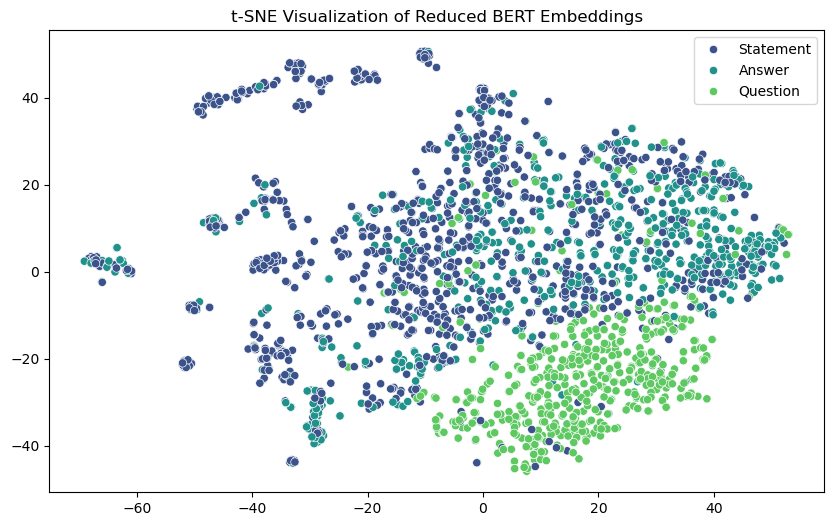

Results for SVM - Training Set:
Training Accuracy: 0.8516
Classification Report (Training):
              precision    recall  f1-score   support

      Answer       0.83      0.68      0.75       670
    Question       0.95      0.93      0.94       549
   Statement       0.82      0.91      0.86      1220

    accuracy                           0.85      2439
   macro avg       0.87      0.84      0.85      2439
weighted avg       0.85      0.85      0.85      2439


Results for SVM - Test Set:
Test Accuracy: 0.7419
Classification Report (Test):
              precision    recall  f1-score   support

      Answer       0.66      0.52      0.58       323
    Question       0.91      0.86      0.89       219
   Statement       0.72      0.83      0.77       504

    accuracy                           0.74      1046
   macro avg       0.76      0.74      0.75      1046
weighted avg       0.74      0.74      0.74      1046



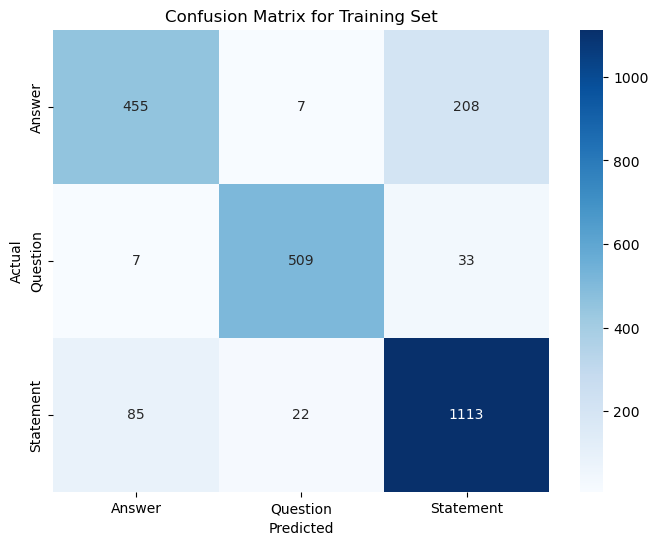

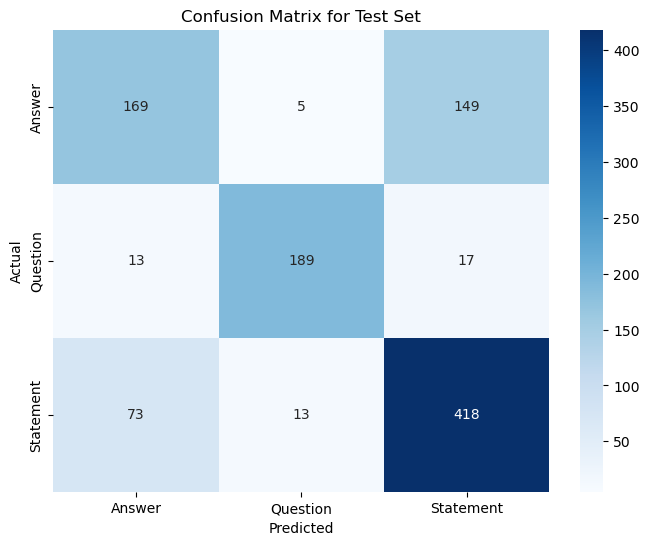

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import pickle
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.svm import SVC
from transformers import BertTokenizer, BertModel
import torch
from tqdm import tqdm
from lime.lime_text import LimeTextExplainer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Function to preprocess data and generate BERT embeddings
def preprocess_data_with_bert(file_path, batch_size=32, max_length=512):
    # Load the data
    df = pd.read_excel(file_path)
    
    # Ensure that 'Text' column is used as the independent variable
    df['Text'] = df['Text'].astype(str)
    
    # Drop any rows where 'Text' or 'Type' is NaN
    df.dropna(subset=['Text', 'Type'], inplace=True)
    
    # Define features and labels
    X = df['Text'].tolist()  # Convert the text to a list
    y = df['Type']
    
    # Encode the labels into numeric values
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)
    
    # Load pre-trained BERT tokenizer and model
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    model = BertModel.from_pretrained('bert-base-uncased').to('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Generate BERT embeddings for the texts in batches
    def get_bert_embeddings(texts):
        all_embeddings = []
        for i in tqdm(range(0, len(texts), batch_size)):
            batch_texts = texts[i:i + batch_size]
            inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors='pt', max_length=max_length).to(model.device)
            with torch.no_grad():
                outputs = model(**inputs)
                batch_embeddings = outputs.last_hidden_state.mean(dim=1)
                all_embeddings.append(batch_embeddings.cpu())
        return torch.cat(all_embeddings, dim=0)
    
    X_embeddings = get_bert_embeddings(X).numpy()
    X_train, X_test, y_train, y_test = train_test_split(X_embeddings, y_encoded, test_size=0.3, random_state=42)
    
    return X_train, X_test, y_train, y_test, label_encoder

# Function for dimensionality reduction using PCA
def reduce_dimensionality_with_pca(X_train, X_test, n_components=50):
    pca = PCA(n_components=n_components)
    X_train_reduced = pca.fit_transform(X_train)
    X_test_reduced = pca.transform(X_test)
    return X_train_reduced, X_test_reduced

# Function to plot confusion matrix
def plot_confusion_matrix(y_test, y_pred, label_encoder, title):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.title(f'Confusion Matrix for {title}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

# Function to train and evaluate SVM
def run_svm(X_train, X_test, y_train, y_test, label_encoder):
    model = SVC(probability=True)  # Enable probability predictions for LIME
    
    model.fit(X_train, y_train)
    y_pred_test = model.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_pred_test)
    
    y_pred_train = model.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_pred_train)
    
    classification_rep_train = classification_report(y_train, y_pred_train, target_names=label_encoder.classes_)
    classification_rep_test = classification_report(y_test, y_pred_test, target_names=label_encoder.classes_)
    
    print("Results for SVM - Training Set:")
    print(f"Training Accuracy: {train_accuracy:.4f}")
    print("Classification Report (Training):")
    print(classification_rep_train)
    
    print("\nResults for SVM - Test Set:")
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print("Classification Report (Test):")
    print(classification_rep_test)
    
    plot_confusion_matrix(y_train, y_pred_train, label_encoder, "Training Set")
    plot_confusion_matrix(y_test, y_pred_test, label_encoder, "Test Set")

    return model
def plot_tsne(X, y, label_encoder):
    tsne = TSNE(n_components=2, random_state=42)
    X_reduced = tsne.fit_transform(X)
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=X_reduced[:, 0], y=X_reduced[:, 1], hue=label_encoder.inverse_transform(y), palette="viridis", legend="full")
    plt.title("t-SNE Visualization of Reduced BERT Embeddings")
    plt.show()
# Updated lime_explain function to handle dimensionality reduction
def lime_explain(model, text, tokenizer, bert_model, label_encoder, class_names, pca):
    explainer = LimeTextExplainer(class_names=class_names)

    def predict_proba(texts):
        embeddings = []
        for t in texts:
            inputs = tokenizer(t, return_tensors='pt', padding=True, truncation=True, max_length=512).to(bert_model.device)
            with torch.no_grad():
                output = bert_model(**inputs).last_hidden_state.mean(dim=1)
            embeddings.append(output.cpu().numpy())
        embeddings = np.vstack(embeddings)
        
        # Apply PCA to reduce dimensions before passing to SVM
        embeddings_reduced = pca.transform(embeddings)
        
        return model.predict_proba(embeddings_reduced)

    exp = explainer.explain_instance(text, predict_proba)
    exp.show_in_notebook()

# Run the preprocessing function to get embeddings
file_path = 'test.xlsx'
X_train, X_test, y_train, y_test, label_encoder = preprocess_data_with_bert(file_path)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=50)
X_train_reduced, X_test_reduced = pca.fit_transform(X_train), pca.transform(X_test)

# Visualize using t-SNE (optional)
plot_tsne(X_train_reduced, y_train, label_encoder)

# Train SVM model on reduced data and evaluate
svm_model = run_svm(X_train_reduced, X_test_reduced, y_train, y_test, label_encoder)

# Select a sample text for explanation with LIME
sample_index = 1  # Change index to test different samples
sample_text = pd.read_excel(file_path)['Text'].iloc[sample_index]

# Generate LIME explanation with PCA for dimensionality alignment
lime_explain(svm_model, sample_text, BertTokenizer.from_pretrained('bert-base-uncased'), BertModel.from_pretrained('bert-base-uncased').to('cuda' if torch.cuda.is_available() else 'cpu'), label_encoder, label_encoder.classes_, pca)


In [9]:
# Select five sample texts for explanation with LIME
sample_indices = [4, 24, 29, 59, 60, 25]  # Adjust indices as needed
sample_texts = pd.read_excel(file_path)['Text'].iloc[sample_indices]

# Loop through each sample text and generate LIME explanations
for idx, sample_text in enumerate(sample_texts):
    print(f"\nLIME Explanation for Sample {idx + 1}:\n")
    lime_explain(
        svm_model,
        sample_text,
        BertTokenizer.from_pretrained('bert-base-uncased'),
        BertModel.from_pretrained('bert-base-uncased').to('cuda' if torch.cuda.is_available() else 'cpu'),
        label_encoder,
        label_encoder.classes_,
        pca
    )



LIME Explanation for Sample 1:




LIME Explanation for Sample 2:




LIME Explanation for Sample 3:




LIME Explanation for Sample 4:




LIME Explanation for Sample 5:




LIME Explanation for Sample 6:

